# Float

In notebook, some topics are skipped since it is tired. See textbook.

# Maximum(Minimum) positive number

Most real numbers are represented by float64.(binary64, double)

By construction, they are bounded.

In [1]:
valmax =(2.0-2.0^(-52))*2.0^1023
valmin =0.5^1022
println("max: $valmax , min: $valmin")

max: 1.7976931348623157e308 , min: 2.2250738585072014e-308


In [2]:
# check whether val1 is sup.
val = 2.0^1024　#overflow

Inf

## Machine epsilon

- def: the distance between 1.0 and minimum value that is larger than 1.0

This is the limitation of computer, thus we cannot exactly represent famous rational numbers.

In [3]:
# machine epsilon
eps(Float64)

2.220446049250313e-16

## Rounding

Rounding numbers is to represent real numbers by float numbers close to them.

there are several ways to round numbers. 

- Round Nearest 
- Round Down
- Round Up

In Julia, default rounding method is Round Nearest. Below, we check this.

In [4]:
ϵ = eps(Float64)

2.220446049250313e-16

In [5]:
1.0 + 0.25*ϵ

1.0

In [6]:
1.0 + 0.5*ϵ

1.0

In [7]:
1.0 + 0.75*ϵ

1.0000000000000002

In [8]:
2.0 - ϵ

1.9999999999999998

In [9]:
2.0 - 0.5*ϵ

2.0

In [10]:
# Overflow depends on rounding
small = 2.0^971
valmax + 0.25*small

1.7976931348623157e308

In [11]:
valmax + 0.5*small

Inf

## Denormalized Number

In [12]:
valmin　# minimum number 

2.2250738585072014e-308

In [13]:
0.5 *valmin # we can deal with smaller number!  due to IEEE regulation

1.1125369292536007e-308

In [14]:
ymin = 2.0^(-51)*2.0^(-1023)

5.0e-324

In [15]:
0.5*ymin

0.0

In [16]:
0.51*ymin

5.0e-324

## Absolute and relative errors

In [17]:
a = [3.0*10^0, 3.0*10^-4, 3.0*10^3]
b = [3.1*10^0, 3.1*10^-4, 3.1*10^3]

Abs = zeros(3)
Abs = abs.(a-b)

3-element Array{Float64,1}:
   0.10000000000000009  
   1.0000000000000026e-5
 100.0                  

In [18]:
relative = zeros(3)
relative = abs.((a-b)./a)

3-element Array{Float64,1}:
 0.03333333333333336
 0.0333333333333334 
 0.03333333333333333

## cancellation of significant digits and loss of trailing digits

Details are skipped.

In [19]:
using Plots
using LinearAlgebra
pyplot()

Plots.PyPlotBackend()

In [20]:
f(x) = (x-1.0)^7 + 15
g(x) = x^7 - 7x^6 +21x^5 -35x^4 + 35x^3 - 21x^2 + 7x + 14 # same function
a = [0.1,0.01]
function creategrid(a)
    
    xmin = 1.0 - a
    xmax = 1.0 + a
    return xgrid = collect(LinRange(xmin,xmax,501))
end

creategrid (generic function with 1 method)

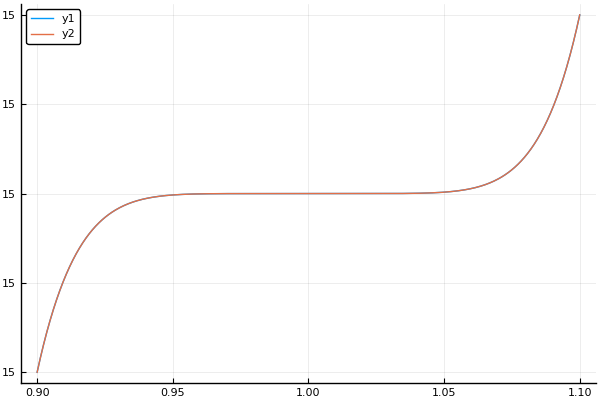

In [21]:
grid1 = creategrid(a[1])
val1 = f.(grid1)
val2 = g.(grid1)
plot(grid1,val1)
plot!(grid1,val2)

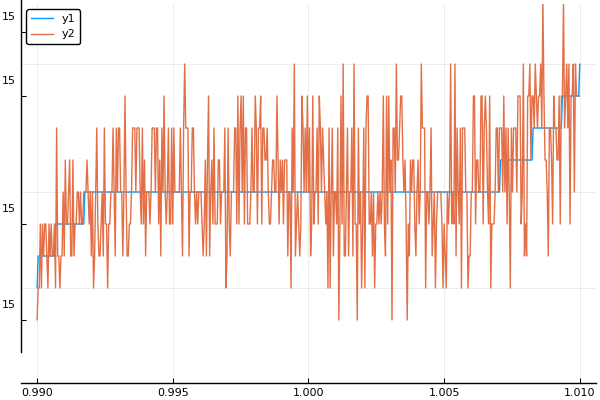

In [22]:
grid2 = creategrid(a[2])
val1 = f.(grid2)
val2 = g.(grid2)
plot(grid2,val1)
plot!(grid2,val2)